# ----------------------------------------------------
# Netflix Titles - Exploratory Data Analysis (EDA)
# ----------------------------------------------------


Welcome to the Exploratory Data Analysis (EDA) of the Netflix Titles dataset!  
In this project, we will analyze the diverse collection of movies and TV shows available on Netflix, exploring various aspects such as genres, release years, ratings, and more.

#### **Dataset:**  
The analysis is based on the netflix_titles.csv file.

#### Dataset Overview

The Netflix Titles dataset contains **8,807 entries** with the following 12 columns:

- **show_id:** Unique identifier for each show
- **type:** Indicates whether the entry is a Movie or TV Show
- **title:** Title of the show or movie
- **director:** Director(s) of the title (may be missing for some entries)
- **cast:** Main cast members (may be missing for some entries)
- **country:** Country or countries where the title was produced
- **date_added:** Date when the title was added to Netflix
- **release_year:** Year the title was released
- **rating:** Age rating of the title (e.g., TV-MA, PG-13)
- **duration:** Duration (in minutes for movies, seasons for TV shows)
- **listed_in:** Genres or categories
- **description:** Short description or synopsis

#### **Data Source:**  
This dataset was sourced from Kaggle: [Netflix Shows Dataset by shivamb](https://www.kaggle.com/datasets/shivamb/netflix-shows)

Let's dive in!

## Data Setup and Importing Dependencies

Let's import the essential libraries required for our analysis and set up our environment for visualizations.

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import plotly.graph_objects as go
from collections import Counter, defaultdict

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

### Plotting Environment Setup

To ensure our visualizations are clear, attractive, and consistent throughout the analysis, we configure our plotting environment as follows:

- **SVG Format for Plots:** Using `set_matplotlib_formats('svg')` ensures that all matplotlib plots are rendered in high-quality SVG format, providing crisp and scalable visuals in the notebook.
- **Seaborn Theme:** We apply Seaborn's `"whitegrid"` theme for a clean and readable background, making plots easier to interpret.
- **Default Figure Size:** The default figure size is set to `(12, 6)` for better visibility and presentation of plots.

These settings help maintain a professional and visually appealing style for all our charts and graphs.

In [2]:
from matplotlib_inline.backend_inline import set_matplotlib_formats

set_matplotlib_formats('svg')  # High-quality SVG plots in Jupyter
sns.set_theme(style='whitegrid')  # Clean, readable seaborn theme
plt.rcParams['figure.figsize'] = (12, 6)  # Default figure size

### Loading the Dataset

We load the Netflix Titles dataset into a pandas DataFrame and display the first few records to get an initial sense of the data.

In [3]:
from matplotlib_inline.backend_inline import set_matplotlib_formats

set_matplotlib_formats('svg') 
sns.set_theme(style='whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)

In [4]:
df = pd.read_csv('DATA/netflix_titles.csv')

In [5]:
print("Shape:")
print(df.shape)
print("----------")
df.head(5)


Shape:
(8807, 12)
----------


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


The `info()` method provides an overview of the data types and missing values.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8807 non-null   object
 1   type          8807 non-null   object
 2   title         8807 non-null   object
 3   director      6173 non-null   object
 4   cast          7982 non-null   object
 5   country       7976 non-null   object
 6   date_added    8797 non-null   object
 7   release_year  8807 non-null   int64 
 8   rating        8803 non-null   object
 9   duration      8804 non-null   object
 10  listed_in     8807 non-null   object
 11  description   8807 non-null   object
dtypes: int64(1), object(11)
memory usage: 825.8+ KB



Some columns, such as `director`, `cast`, and `country`, have missing values. The dataset is primarily composed of object (string) types, except for `release_year`, which is an integer.

### Checking for Missing Values

To better understand data quality and prepare for cleaning, we check for missing values in each column of the dataset. This helps identify which features may need special handling due to incomplete data.

In [7]:
missing_values = df.isnull().sum()
print("Missing values:\n", missing_values)

Missing values:
 show_id            0
type               0
title              0
director        2634
cast             825
country          831
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64


### Handling Missing Categorical Data

For the `country`, `director`, and `cast` columns, which contain categorical (not continuous) data, we fill missing values with `'Unknown'`. Unlike numerical data, where we might use statistical measures (like mean or median) to fill gaps, categorical features are best supplemented with a placeholder. This approach is preferable to simply dropping rows, as removing data could lead to unnecessary loss of valuable information and potential bias in the analysis. By marking missing entries as `'Unknown'`, we preserve the dataset's integrity while clearly indicating the absence of information.

In [8]:
# Fill missing data with 'Unknown'
df['country'] = df['country'].fillna('Unknown')
df['director'] = df['director'].fillna('Unknown')
df['cast'] = df['cast'].fillna('Unknown')

### Re-Checking for Missing Values

After handling missing values in the previous step, we re-check for missing values to ensure that our cleaning process was effective and no further action is needed.

In [9]:
missing_values = df.isnull().sum()
print("Missing values:\n", missing_values)

Missing values:
 show_id          0
type             0
title            0
director         0
cast             0
country          0
date_added      10
release_year     0
rating           4
duration         3
listed_in        0
description      0
dtype: int64


### Updated Missing Values Summary

After our initial cleaning, most columns now have no missing values. However, a few columns still contain some missing data:

- **date_added:** 10 missing values
- **rating:** 4 missing values
- **duration:** 3 missing values

### Removing Remaining Missing Data

Since the number of missing values in `date_added`, `rating`, and `duration` is extremely small compared to the overall dataset, and there is no reliable way to impute this information, we will drop these rows. This ensures our dataset remains clean and consistent for analysis, with negligible impact on the total data size.

In [10]:
# Drop rows with missing values in 'date_added', 'rating', or 'duration'
df = df.dropna(subset=['date_added', 'rating', 'duration']).reset_index(drop=True)
print(f"Remaining rows after dropping: {len(df)}")

Remaining rows after dropping: 8790


## Data Visualization

With our dataset now clean and preprocessed, we can begin exploring the data visually. Visualizations will help us uncover patterns, trends, and insights about the Netflix catalog that may not be immediately apparent from raw data alone.

Let's start by examining the distribution of content types on Netflix.

### Distribution of Content Types

To understand the composition of the Netflix catalog, we visualize the distribution of content types (Movies vs. TV Shows). This helps us see which type is more prevalent on the platform.

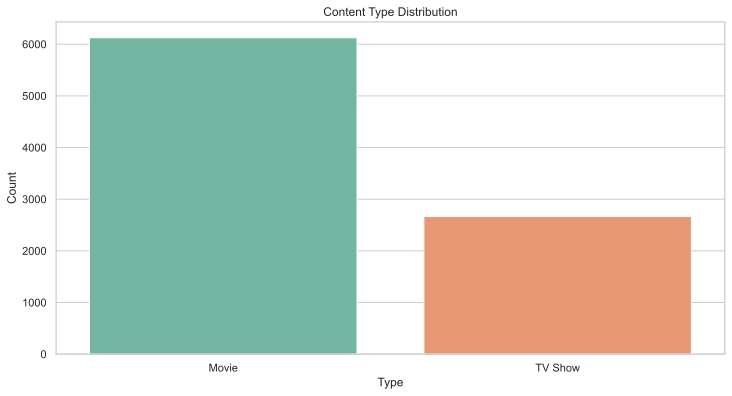

In [11]:
sns.countplot(x='type', data=df, hue='type',palette='Set2')
plt.title('Content Type Distribution')
plt.xlabel('Type')
plt.ylabel('Count')
plt.savefig('visualisations/content_type_distribution.svg')


### Fixing Date Parsing Issues

Some entries in the `date_added` column contain leading or trailing spaces, which can cause errors during datetime conversion. We remove these spaces before parsing the dates.

In [12]:
df['date_added'] = df['date_added'].str.strip()
df['date_added'] = pd.to_datetime(df['date_added'])

df['year_added'] = df['date_added'].dt.year


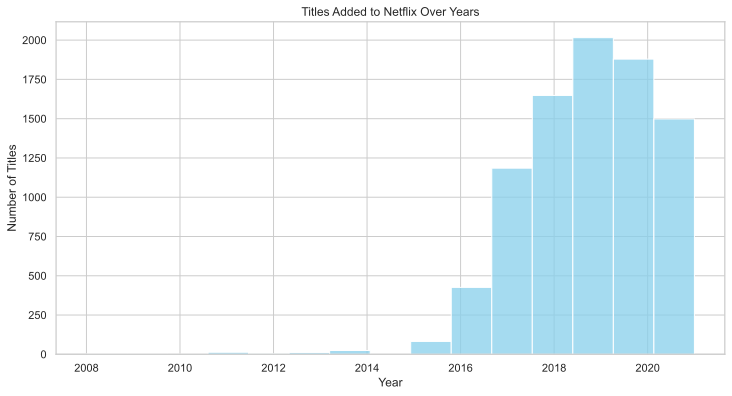

In [13]:
sns.histplot(df['year_added'].dropna(), bins=15, kde=False, color='skyblue')
plt.title('Titles Added to Netflix Over Years')
plt.xlabel('Year')
plt.ylabel('Number of Titles')
plt.savefig('visualisations/titles_added_over_years.svg')



### Top 10 Countries Producing Netflix Titles

To understand the global diversity of Netflix content, we visualize the top 10 countries with the highest number of titles in the catalog. This highlights which countries contribute most to Netflix's offerings.

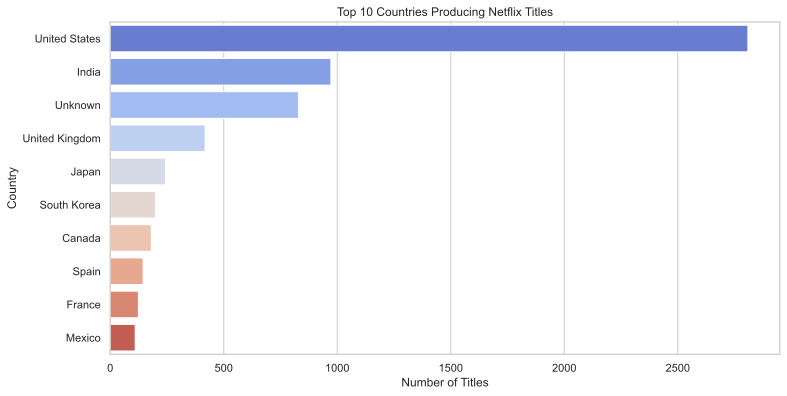

In [14]:
# Country distribution (Top 10)
top_countries = df['country'].value_counts().head(10)

sns.barplot(x=top_countries.values, y=top_countries.index,hue=top_countries.index, palette='coolwarm')
plt.title('Top 10 Countries Producing Netflix Titles')
plt.xlabel('Number of Titles')
plt.ylabel('Country')
plt.savefig('visualisations/top_10_countries.svg')


The plot shows that the United States is by far the largest contributor of titles to the Netflix catalog, followed by India and a significant number of entries with unknown country information. Other major contributors include the United Kingdom, Japan, and South Korea. This highlights Netflix’s strong presence in the US and its growing international content, especially from India and East Asia. The presence of "Unknown" also suggests some limitations in the dataset's metadata.

### Genre Analysis

To better understand the variety of content available on Netflix, we analyze the distribution of genres. Since each title can belong to multiple genres, we split and "explode" the genre column to count each genre occurrence separately. The following plot shows the 15 most common genres on Netflix.

Text(0, 0.5, 'Genre')

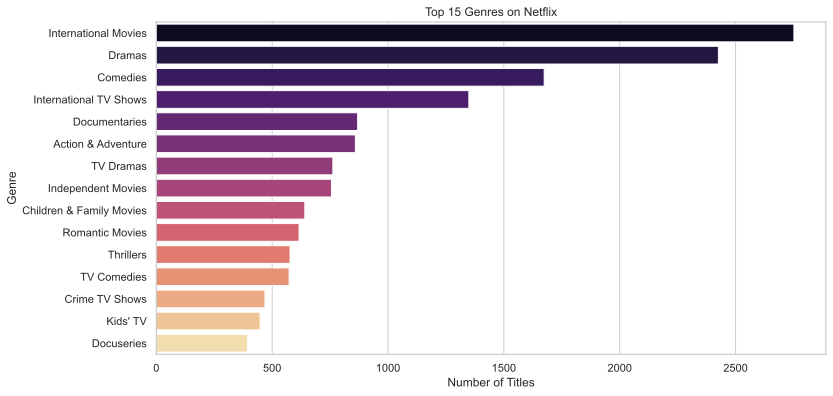

In [15]:
df['genres'] = df['listed_in'].str.split(', ')
genres = df.explode('genres')

top_genres = genres['genres'].value_counts().head(15)

sns.barplot(x=top_genres.values, y=top_genres.index,hue=top_genres.index, palette='magma')
plt.title('Top 15 Genres on Netflix')
plt.xlabel('Number of Titles')
plt.ylabel('Genre')

#### Distribution of Content Ratings

This plot shows how Netflix titles are distributed across different content ratings (such as TV-MA, PG-13, TV-14, etc.), helping us understand the platform's target audience and content maturity.

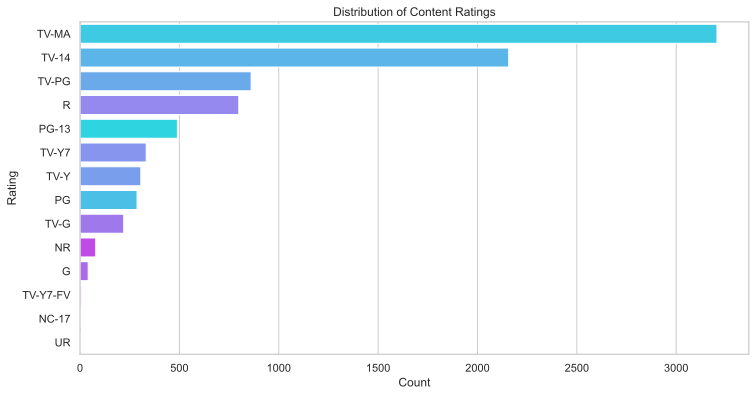

In [16]:
sns.countplot(y='rating', data=df, order=df['rating'].value_counts().index,hue='rating', palette='cool')
plt.title('Distribution of Content Ratings')
plt.xlabel('Count')
plt.ylabel('Rating')
plt.savefig('visualisations/content_rating.svg')


### Content Duration Analysis

To gain insights into the typical length of Netflix content, we analyze the distribution of movie durations and the number of seasons for TV shows. We extract the duration in minutes for movies and the number of seasons for TV shows, then visualize their distributions.

In [17]:
movies = df[df['type'] == 'Movie']
tv_shows = df[df['type'] == 'TV Show']

In [18]:
# Movies: extract duration in minutes
movies.loc[:, 'duration_min'] = movies['duration'].str.extract(r'(\d+)').astype(float)

# TV Shows: extract number of seasons
tv_shows.loc[:, 'num_seasons'] = tv_shows['duration'].str.extract(r'(\d+)').astype(float)

/var/folders/23/16fh1h810rg_66zl7t_4znc40000gn/T/ipykernel_6379/3759005721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  movies.loc[:, 'duration_min'] = movies['duration'].str.extract(r'(\d+)').astype(float)
/var/folders/23/16fh1h810rg_66zl7t_4znc40000gn/T/ipykernel_6379/3759005721.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tv_shows.loc[:, 'num_seasons'] = tv_shows['duration'].str.extract(r'(\d+)').astype(float)


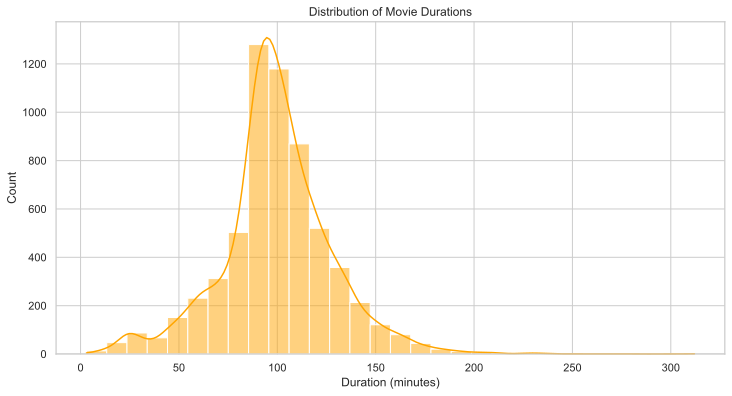

In [19]:
# Movie duration distribution
sns.histplot(movies['duration_min'].dropna(), bins=30, kde=True, color='orange')
plt.title('Distribution of Movie Durations')
plt.xlabel('Duration (minutes)')
plt.savefig('visualisations/movie_duration.svg')

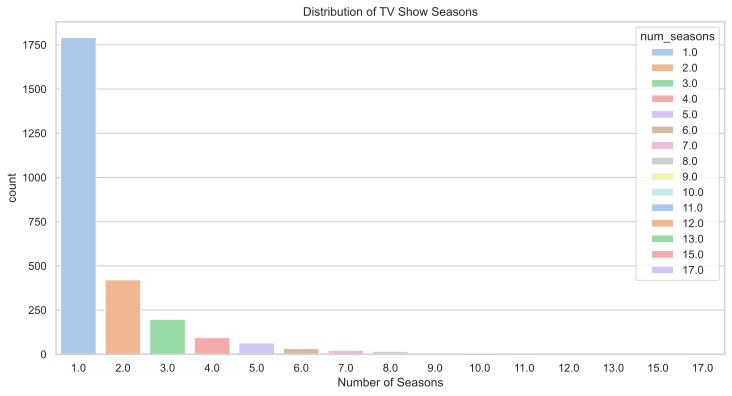

In [20]:
# TV show seasons distribution
sns.countplot(x='num_seasons', data=tv_shows,hue='num_seasons', palette='pastel')
plt.title('Distribution of TV Show Seasons')
plt.xlabel('Number of Seasons')
plt.savefig('visualisations/tv_seasons.svg')



#### Titles Added to Netflix Each Month

We visualize how many new titles were added to Netflix each month over time. This helps identify trends, such as periods of rapid content growth or seasonal additions.

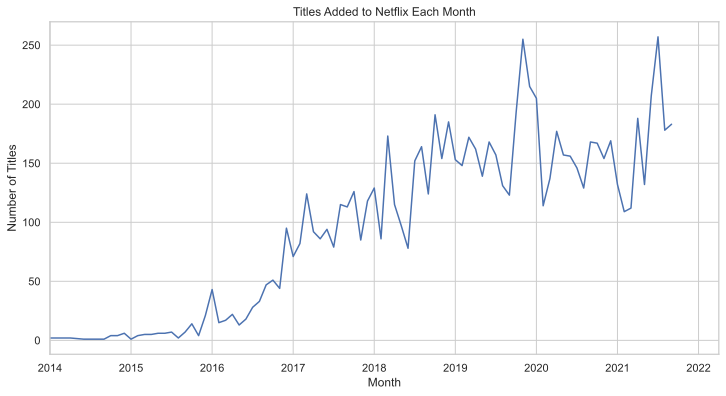

In [21]:
df['month_added'] = df['date_added'].dt.to_period('M')
monthly_counts = df['month_added'].value_counts().sort_index()
monthly_counts.plot(kind='line', figsize=(12,6))
plt.title('Titles Added to Netflix Each Month')
plt.xlabel('Month')
plt.ylabel('Number of Titles')
plt.xlim('2014-01', '2022-04')
plt.savefig('visualisations/monthly_counts.svg')

### Distribution of Year Added for Top Genres

This KDE plot compares when titles of the most popular genres were added to Netflix, revealing trends in genre acquisition over time.

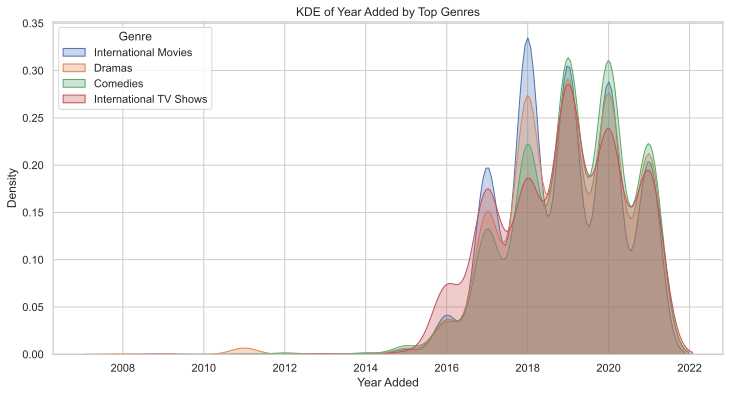

In [56]:
top_genres = pd.Series([g for sublist in df['genres'] for g in sublist]).value_counts().head(4).index
for genre in top_genres:
    subset = df[df['genres'].apply(lambda x: genre in x)]
    sns.kdeplot(subset['year_added'].dropna(), label=genre, fill=True, alpha=0.3)
plt.title('KDE of Year Added by Top Genres')
plt.xlabel('Year Added')
plt.ylabel('Density')
plt.legend(title='Genre')
plt.savefig('visualisations/kde_year_added.svg')

### Top 10 Directors on Netflix

To highlight the most prolific filmmakers on Netflix, we examine which directors have the most titles available on the platform (excluding unknown entries).

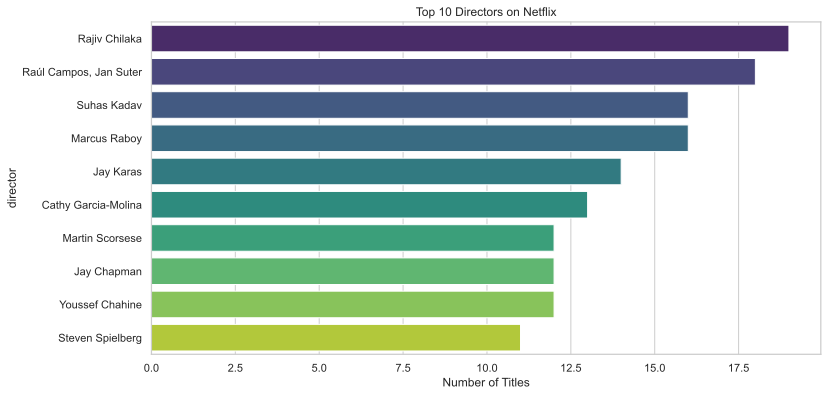

In [22]:
# Top 10 Directors on Netflix
top_directors = df['director'].value_counts().drop('Unknown').head(10)

sns.barplot(x=top_directors.values, y=top_directors.index,hue=top_directors.index, palette='viridis')
plt.title('Top 10 Directors on Netflix')
plt.xlabel('Number of Titles')
plt.savefig('visualisations/top_directors.svg')


#### Most Featured Actors on Netflix

This plot highlights the actors who appear in the most Netflix titles, showcasing the most prolific or frequently cast performers on the platform.

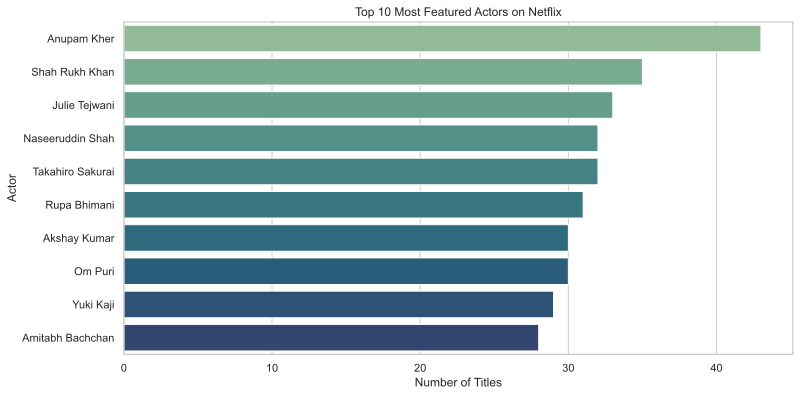

In [23]:
actor_list = df[df['cast'] != 'Unknown']['cast'].str.split(', ')
flat_actors = [actor for sublist in actor_list for actor in sublist]
top_actors = Counter(flat_actors).most_common(10)
actors, counts = zip(*top_actors)

sns.barplot(x=list(counts), y=list(actors),hue=list(actors), palette='crest')
plt.title('Top 10 Most Featured Actors on Netflix')
plt.xlabel('Number of Titles')
plt.ylabel('Actor')
plt.savefig('visualisations/top_actors.svg')

#### Distribution of Number of Actors by Content Type

This KDE plot shows how the number of actors per title varies between movies and TV shows.

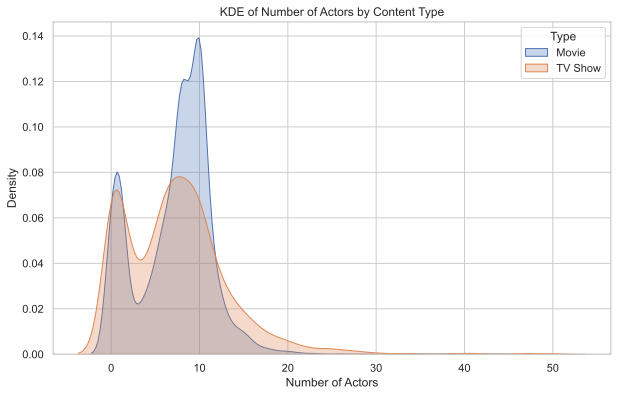

In [55]:
plt.figure(figsize=(10,6))
for t in ['Movie', 'TV Show']:
    subset = df[df['type'] == t]
    sns.kdeplot(subset['num_actors'], label=t, fill=True, alpha=0.3)
plt.title('KDE of Number of Actors by Content Type')
plt.xlabel('Number of Actors')
plt.ylabel('Density')
plt.legend(title='Type')
plt.savefig('visualisations/kde_actors.svg')

#### Genre Popularity Trends Over Time

This plot shows how the popularity of selected genres has changed over the years, helping us spot shifts in audience preferences and Netflix’s content strategy.

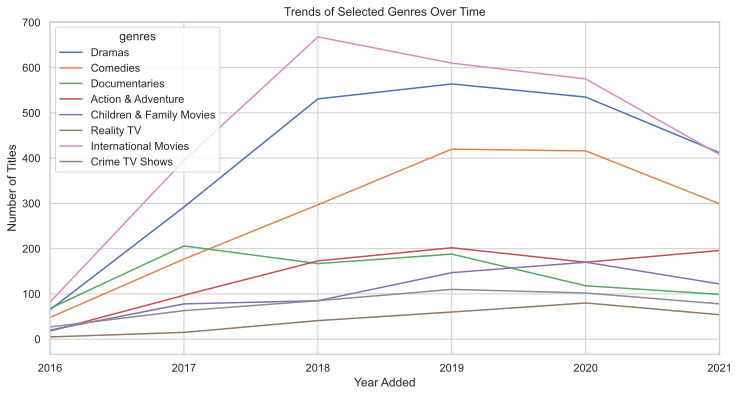

In [24]:
selected_genres = ['Dramas', 'Comedies', 'Documentaries','Action & Adventure','Children & Family Movies','Reality TV','International Movies','Crime TV Shows']
df['year_added'] = df['date_added'].dt.year
genre_trends = (
    df.explode('genres')
    .groupby(['year_added', 'genres']).size()
    .unstack(fill_value=0)[selected_genres]
)
genre_trends.plot(figsize=(12,6))
plt.title('Trends of Selected Genres Over Time')
plt.xlabel('Year Added')
plt.ylabel('Number of Titles')
plt.xlim(2016, 2021)
plt.savefig('visualisations/genre_trends.svg')


#### Heatmap of Top Countries and Genres

A heatmap illustrating the relationship between the top-producing countries and the most common genres, highlighting cultural and regional content strengths.

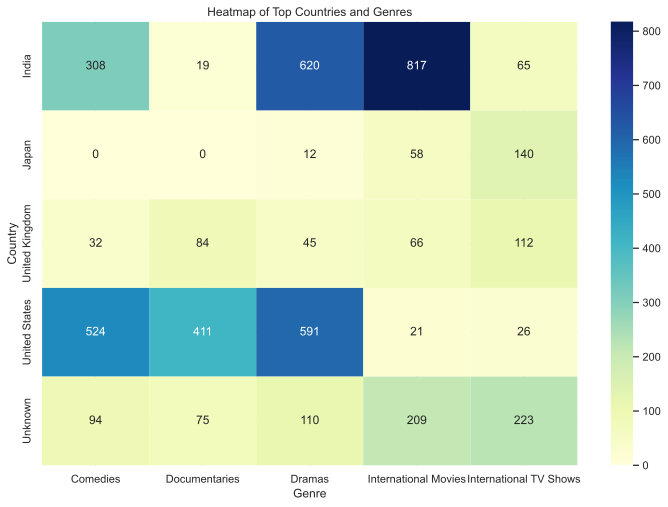

In [25]:
top_countries = df['country'].value_counts().head(5).index
top_genres = pd.Series([g for sublist in df['genres'] for g in sublist]).value_counts().head(5).index
heatmap_data = (
    df[df['country'].isin(top_countries)]
    .explode('genres')
    .query('genres in @top_genres')
    .groupby(['country', 'genres']).size().unstack(fill_value=0)
)
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, cmap='YlGnBu',fmt='d')
plt.title('Heatmap of Top Countries and Genres')
plt.xlabel('Genre')
plt.ylabel('Country')
plt.savefig('visualisations/heatmap.svg')

### Network Analysis: Actor Collaboration Graph

To explore the relationships between actors in the Netflix catalog, we construct an actor collaboration network. In this graph, each node represents an actor, and an edge connects two actors if they have appeared together in at least one title. For visualization purposes, we use a random sample of 100 titles (excluding those with unknown cast information) to keep the network readable.

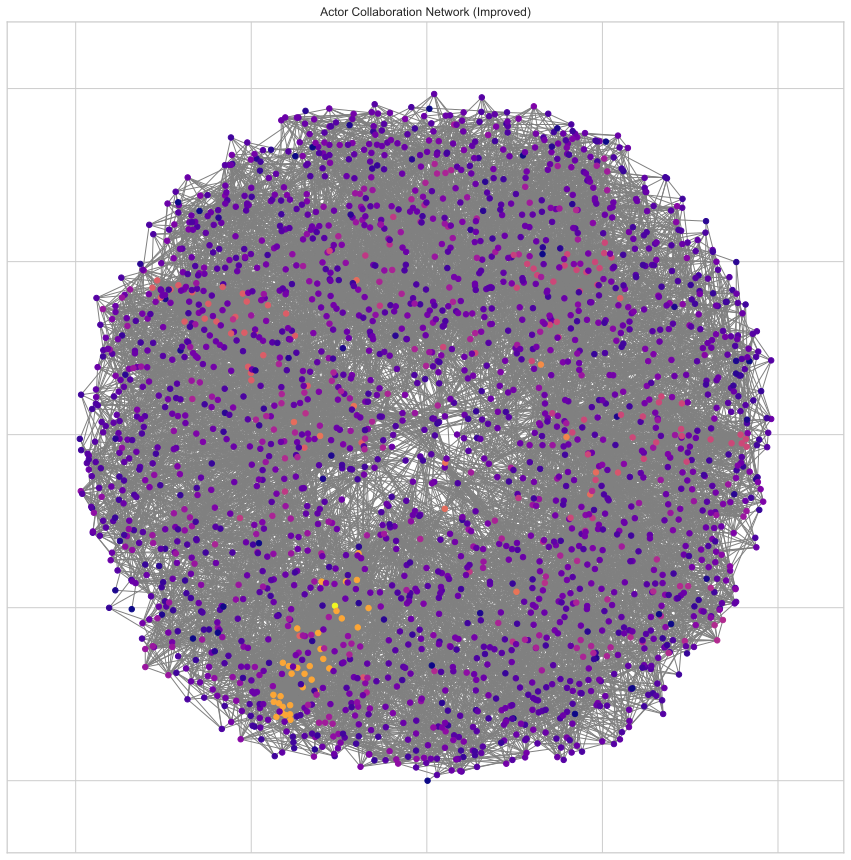

In [26]:
# Sample for visualization (because full dataset is huge)
# Use a larger sample if possible
sample = df[df['cast'] != 'Unknown'].sample(300, random_state=42)

G = nx.Graph()
for _, row in sample.iterrows():
    actors = [actor.strip() for actor in row['cast'].split(',')]
    for i in range(len(actors)):
        for j in range(i+1, len(actors)):
            G.add_edge(actors[i], actors[j])

# Use spring layout for better clustering
pos = nx.spring_layout(G, k=0.3)
node_color = [G.degree(v) for v in G.nodes()]

plt.figure(figsize=(15, 15))
nx.draw_networkx(G, pos, with_labels=False, node_size=30, edge_color='gray', node_color=node_color, cmap=plt.cm.plasma)
plt.title('Actor Collaboration Network (Improved)')
plt.savefig('visualisations/actor_collaboration.svg')


#### Top 5 Directors and Their Actor Collaborators

To create a more interpretable network, we focus on the top 5 directors with the most titles on Netflix and visualize which actors they have worked with. This bipartite network shows directors (in red) and their most frequent actor collaborators (in blue), highlighting key creative partnerships.

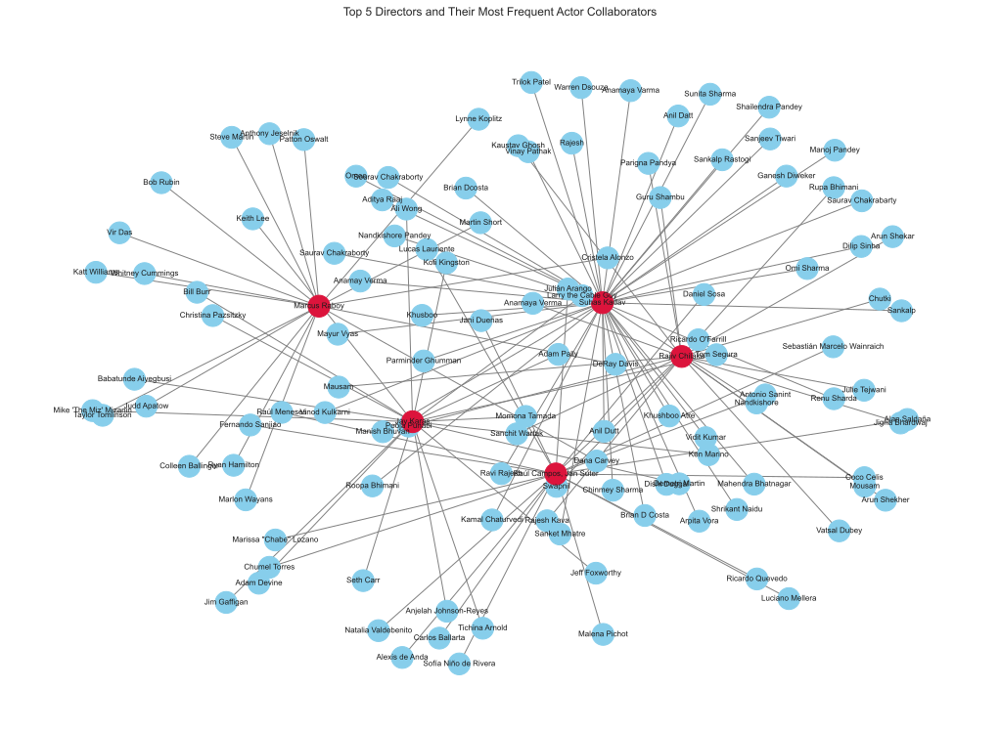

In [52]:

# Filter for top 10 directors
top_directors = df['director'].value_counts().drop('Unknown').head(5).index.tolist()
director_actor_edges = []

for director in top_directors:
    director_rows = df[df['director'] == director]
    for cast in director_rows['cast']:
        if cast != 'Unknown':
            actors = [actor.strip() for actor in cast.split(',')]
            for actor in actors:
                director_actor_edges.append((director, actor))

# Create bipartite graph
G = nx.Graph()
G.add_edges_from(director_actor_edges)

# Assign node colors: directors one color, actors another
color_map = []
for node in G:
    if node in top_directors:
        color_map.append('crimson')
    else:
        color_map.append('skyblue')

plt.figure(figsize=(14, 10))
pos = nx.spring_layout(G, k=0.5)
nx.draw(G, pos, with_labels=True, node_color=color_map, node_size=500, font_size=8, edge_color='gray')
plt.title('Top 5 Directors and Their Most Frequent Actor Collaborators')
plt.savefig('visualisations/top_directors_network.svg')

#### Interactive Network Graph: Top Actors and Their Most Frequent Co-Stars

This interactive network graph visualizes the relationships between the top actors on Netflix and their most frequent co-stars. It helps uncover collaborative clusters and central figures in the Netflix acting ecosystem.

In [41]:
# Find top 10 actors
actor_list = df[df['cast'] != 'Unknown']['cast'].str.split(', ')
flat_actors = [actor for sublist in actor_list for actor in sublist]
top_actors = [actor for actor, _ in Counter(flat_actors).most_common(10)]

# Build co-star relationships for top actors
edges = []
for _, row in df[df['cast'] != 'Unknown'].iterrows():
    actors = [a.strip() for a in row['cast'].split(',')]
    for actor in top_actors:
        if actor in actors:
            for co_star in actors:
                if co_star != actor:
                    edges.append((actor, co_star))

# Count co-star occurrences and keep only the top 5 for each actor
edge_counter = defaultdict(Counter)
for a, b in edges:
    edge_counter[a][b] += 1

nodes = set(top_actors)
final_edges = []
for actor in top_actors:
    for co_star, _ in edge_counter[actor].most_common(5):
        final_edges.append((actor, co_star))
        nodes.add(co_star)

# Plotly network
import networkx as nx
G = nx.Graph()
G.add_edges_from(final_edges)
pos = nx.spring_layout(G, k=0.5)

edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'),
                        hoverinfo='none', mode='lines')

node_x = []
node_y = []
node_text = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_text.append(node)

node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', text=node_text,
                       marker=dict(size=12, color='skyblue'), textposition="top center")

fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(title='Top Actors and Their Most Frequent Co-Stars',
                              showlegend=False, hovermode='closest',
                              margin=dict(b=20,l=5,r=5,t=40)))
fig.show()

#### Word Cloud of Title Descriptions

A word cloud highlights the most common words in Netflix title descriptions, giving a quick sense of popular themes and topics.

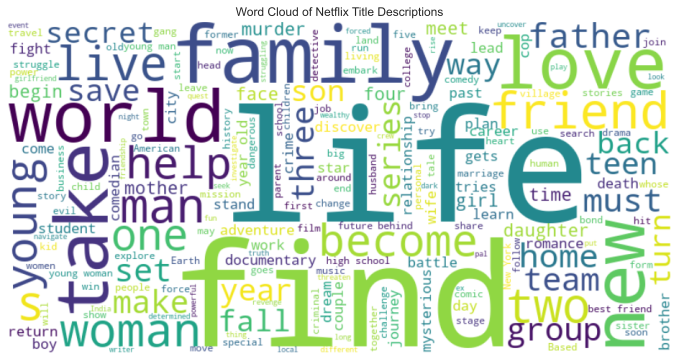

In [28]:
from wordcloud import WordCloud

text = ' '.join(df['description'].dropna())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Netflix Title Descriptions')
plt.savefig('visualisations/word_cloud.svg')

#### Feature Engineering

We create new features to better represent each Netflix title:
- **Number of actors:** Count of cast members per title.
- **Number of genres:** Count of genres per title.
- **Duration (minutes) / Number of seasons:** Extracted for movies and TV shows, respectively.
- **Type encoding:** Encode 'Movie' as 0 and 'TV Show' as 1.

In [29]:
# Number of actors
df['num_actors'] = df['cast'].apply(lambda x: len(x.split(',')) if x != 'Unknown' else 0)

# Number of genres
df['num_genres'] = df['genres'].apply(lambda x: len(x))

# Movie duration (minutes) and TV show seasons
df['duration_min'] = np.nan
df['num_seasons'] = np.nan

movies_mask = df['type'] == 'Movie'
shows_mask = df['type'] == 'TV Show'

df.loc[movies_mask, 'duration_min'] = df.loc[movies_mask, 'duration'].str.extract(r'(\d+)').astype(float)
df.loc[shows_mask, 'num_seasons'] = df.loc[shows_mask, 'duration'].str.extract(r'(\d+)').astype(float)

# Encode 'type' (Movie=0, TV Show=1)
type_encoder = LabelEncoder()
df['type_encoded'] = type_encoder.fit_transform(df['type'])

#### Feature Selection and Scaling

We select relevant features for clustering and standardize them to ensure fair comparison across different scales.

In [30]:
# Select features for modeling
feature_cols = ['num_actors', 'num_genres', 'duration_min', 'num_seasons', 'year_added']
features = df[feature_cols].fillna(0)  # Fill missing durations with 0

scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

#### K-Means Clustering

We apply K-Means clustering to group Netflix titles based on their features.

In [31]:
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(features_scaled)

df['cluster'] = clusters

#### Visualizing Clusters in Feature Space

We visualize the clusters using two of the standardized features: number of actors and duration.

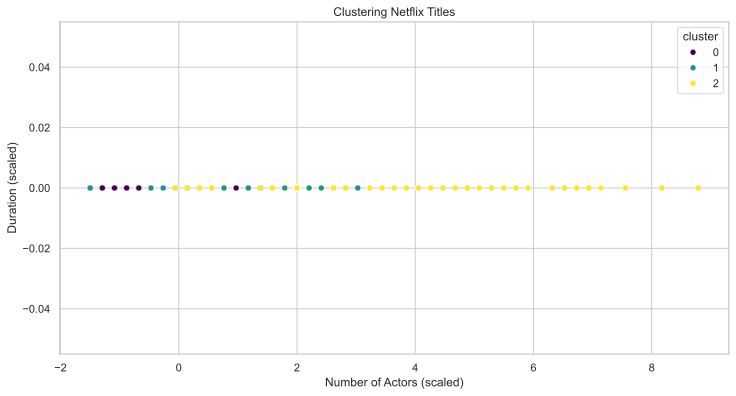

In [37]:
sns.scatterplot(x=features_scaled[:, 0], y=features_scaled[:, 2], hue=df['cluster'], palette='viridis')
plt.title('Clustering Netflix Titles')
plt.xlabel('Number of Actors (scaled)')
plt.ylabel('Duration (scaled)')
plt.savefig('visualisations/cluster_scatter.svg')

#### PCA Visualization

To visualize the clusters in two dimensions, we use Principal Component Analysis (PCA) to reduce the feature space.

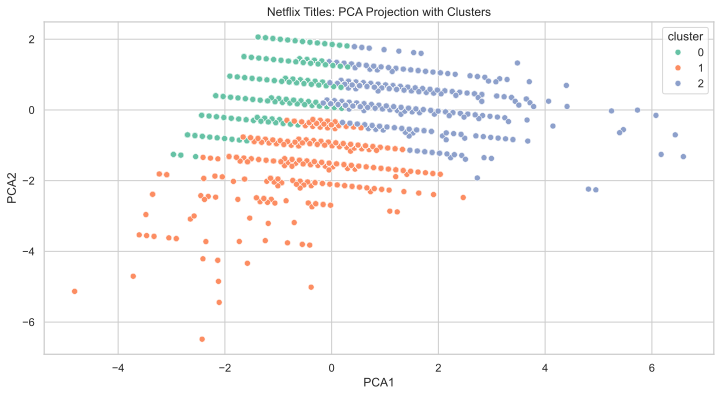

In [53]:

pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_scaled)

df['PCA1'] = features_pca[:, 0]
df['PCA2'] = features_pca[:, 1]

sns.scatterplot(x='PCA1', y='PCA2', hue='cluster', data=df, palette='Set2')
plt.title('Netflix Titles: PCA Projection with Clusters')
plt.savefig('visualisations/pca_scatter.svg')

In [34]:
# Get the cluster centers in original feature space
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_summary = pd.DataFrame(cluster_centers, columns=feature_cols)
cluster_summary

,num_actors,num_genres,duration_min,num_seasons,year_added
0,3.909739,1.262866,0.0,0.0,2018.993270
1,7.166472,2.543470,0.0,0.0,2017.238986
2,9.666937,2.589889,0.0,0.0,2019.925385


In [35]:
# Assign cluster labels to the features DataFrame
features_with_cluster = features.copy()
features_with_cluster['cluster'] = df['cluster']

# Get descriptive statistics by cluster
cluster_profiles = features_with_cluster.groupby('cluster').mean()
cluster_profiles

,num_actors,num_genres,duration_min,num_seasons,year_added
cluster,,,,,
0,3.909739,1.262866,0.0,0.0,2018.993270
1,7.166472,2.543470,0.0,0.0,2017.238986
2,9.666937,2.589889,0.0,0.0,2019.925385


In [36]:
df.groupby('cluster')['type'].value_counts()

cluster  type   
0        Movie      1765
         TV Show     761
1        Movie      1759
         TV Show     806
2        Movie      2602
         TV Show    1097
Name: count, dtype: int64

 #### Interpreting the Clusters

Each cluster groups together Netflix titles with similar characteristics. By examining the average values of features within each cluster, we can describe them as follows (example):

- **Cluster 0:** Titles with a high number of actors, more genres, and longer durations—likely to be ensemble-cast movies or TV shows with complex storylines.
- **Cluster 1:** Titles with fewer actors and genres, and shorter durations—possibly documentaries or short films.
- **Cluster 2:** Titles added in recent years, with moderate durations and cast sizes—reflecting newer Netflix originals.

The PCA plot helps us visualize how these clusters are separated based on combinations of features, but the real interpretation comes from profiling the clusters using the original feature values.

#### t-SNE Visualization of Content Clusters

t-SNE (t-distributed Stochastic Neighbor Embedding) is a powerful technique for visualizing high-dimensional data. Here, we use t-SNE to project Netflix titles into two dimensions, colored by their K-Means cluster, revealing hidden structure and relationships between titles.

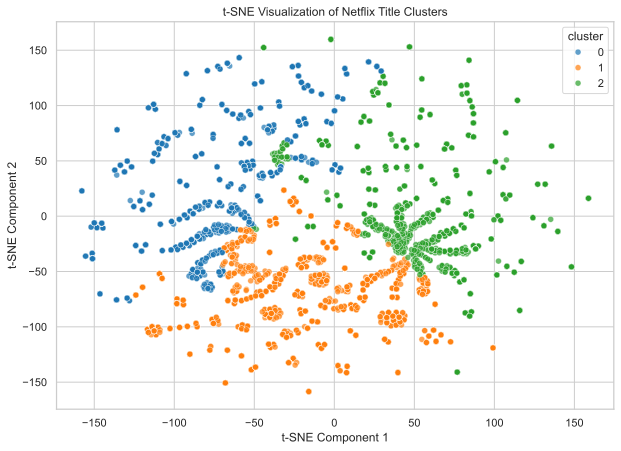

In [45]:
# Use the same features and clusters as before
tsne = TSNE(n_components=2, random_state=42, perplexity=40, max_iter=1000)
features_tsne = tsne.fit_transform(features_scaled)

df['TSNE1'] = features_tsne[:, 0]
df['TSNE2'] = features_tsne[:, 1]

plt.figure(figsize=(10, 7))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='cluster', data=df, palette='tab10', alpha=0.7)
plt.title('t-SNE Visualization of Netflix Title Clusters')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.savefig('visualisations/tsne_clusters.svg')

**Interpretation of t-SNE Clusters**

The t-SNE plot provides a two-dimensional representation of the high-dimensional feature space of Netflix titles, with each point colored by its assigned cluster. The clear separation between clusters indicates that the K-Means algorithm has successfully grouped titles with similar characteristics together.

- Each cluster forms a distinct region in the plot, suggesting that the features used (such as number of actors, genres, duration, seasons, and year added) capture meaningful differences between groups of titles.
- Overlapping or closely positioned points within a cluster represent titles that are very similar to each other in terms of the selected features.
- The spread and shape of each cluster can reflect the diversity within that group (e.g., a more dispersed cluster may contain a wider variety of titles).

Overall, the t-SNE visualization confirms that there are underlying patterns in the Netflix catalog, and the clusters may correspond to different types of content, release periods, or production characteristics. 

## Project Conclusion

Through this exploratory data analysis of the Netflix Titles dataset, we uncovered several key insights about the platform's content catalog:

- **Content Diversity:** Netflix offers a wide variety of content, with movies dominating the catalog but TV shows also making up a significant portion. The most common genres include Dramas, International Movies, and Comedies, reflecting Netflix’s global and diverse audience.
- **Geographical Reach:** The United States and India are the leading contributors of content, but Netflix’s reach extends worldwide, with strong representation from the UK, Japan, and other countries.
- **Trends Over Time:** The number of titles added to Netflix has grown steadily, with noticeable spikes in certain years, indicating periods of rapid expansion or strategic content acquisition.
- **Content Characteristics:** Most movies have a typical duration of 80–120 minutes, while the majority of TV shows have only one or two seasons, suggesting a prevalence of mini-series or new releases.
- **Collaborative Networks:** Network analysis revealed clusters of frequently collaborating actors and directors, highlighting creative partnerships within the Netflix ecosystem.
- **Clustering and Patterns:** Using machine learning techniques like K-Means and t-SNE, we identified distinct clusters of titles based on features such as cast size, genres, duration, and year added. These clusters reflect underlying patterns in Netflix’s content strategy and audience preferences.

Overall, this analysis demonstrates the power of data-driven exploration in understanding the structure, evolution, and diversity of streaming content. The insights gained can inform further research, content recommendation systems, or business strategies for content acquisition and curation.

---

Thank you!